# Residential Smart Grid

In [1]:
# Import packages (runs on Julia 1.8.5)
using JuMP, HiGHS
using CSV, DataFrames
using Plots, StatsPlots
using Images
using Dates
using PlotThemes
using DelimitedFiles

We want to schedule the residential system pictured in the diagram below:

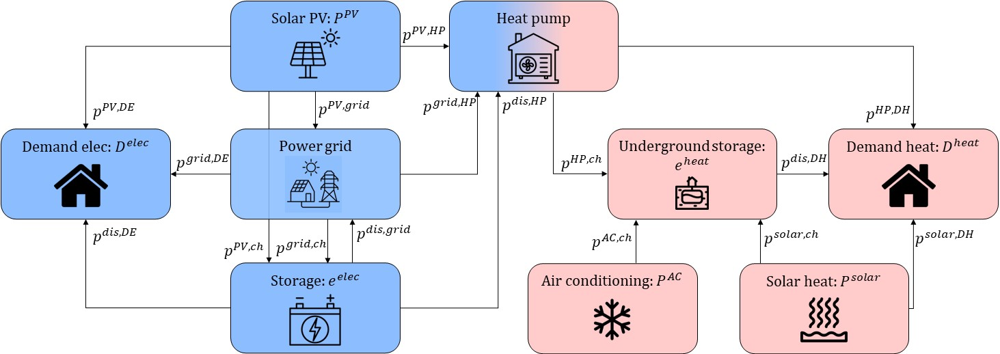

In [2]:
img = load("Diagram.jpg")

## Input data

In [204]:
# Input number of days, number of time periods per day
nb_d = 365
nb_d_all = 365 + 31 + 28 + 31 + 4
Δt = 1 # Duration of each time interval, in hours
year = 2021

# Electrical storage data
E_elec = 49*1 # Capacity (kWh)
P_elec_ch = 16*1 # Max charge (kW)
P_elec_dis = 10*1 # Max discharge (kW)
η_elec_ch = 0.97 # Charging efficiency
η_elec_dis = 0.97 # Discharging efficiency
E_elec_init = 0.0 #33.0 # Initial state of energy (kWh)
E_elec_end = E_elec_init # Final state of energy (kWh)
ρ_elec = 0.99 # Proportion of stored energy that is still available in the next period (i.e. does not leak)

# Heat storage data
E_heat = 290*16 # Capacity (kWh)
P_heat_ch = 10*1.02 # Max charge (kW)
P_heat_dis = 9*1.02 # Max discharge (kW)
η_heat_ch = 0.78 # Charging efficiency
η_heat_dis = 0.78 # Discharging efficiency
E_heat_init = 0.0 #107.0 # Initial state of energy (kWh)
E_heat_end = E_heat_init # Initial state of energy (kWh)
ρ_heat = 1-(7e-5) #0.99 # Proportion of stored energy that is still available in the next period (i.e. does not leak) 

# Heat pump data
P_HP = 15 # Capacity for heat production (kW)
COP = 4 # Coefficient of performance

# Grid data
C_sell_fixed = 0.001*87.90 # Fixed price for selling electricity to the grid (€/kWh)
C_buy_fixed = C_sell_fixed + 0.2 # Fixed price for using electricity from the grid (€/kWh)

# Uncertainty
nb_scn = 1
π = 1/nb_scn * ones(nb_scn) # Probability for each scenario

budget = 1000000

;

In [205]:
# Other parameters

# Sets
nb_t_tot = Int(nb_d * 24 / Δt) #Int(nb_d_all * 24 / Δt)
T = [1:nb_t_tot;]
nb_t_y = Int(nb_d * 24 / Δt)
T_plt = [1:nb_t_y;]
D1 = [1:Int(24 / Δt);]
DT = [D1[end]+1:T[end];]
D_summer = [4105:4128;] # 21st June 2021
D_winter = [8498:8521;] # 21st Dec 2021
Ω = [1:nb_scn;]

# Prices in vectors
#=
C_buy = C_buy_fixed * ones(nb_t_tot)
C_sell = C_sell_fixed * ones(nb_t_tot)
=#
C_df = CSV.read("Day-ahead Prices_DK2_2021_2022.csv", DataFrame)
C_array = 0.001*(C_df.Price)
C_buy = C_array.+0.2
C_sell = C_array#.-0.00001


# Electrical load
D_elec = CSV.read("data_d_elec.csv", DataFrame)

# Heat load
D_heat = CSV.read("data_d_heat.csv", DataFrame)
D_heat = (-1) .* D_heat[:,2:end]

# Heat from AC
P_AC = CSV.read("data_d_cool.csv", DataFrame)
P_AC = (-1) .* P_AC[:,2:end]

# Solar prod
nb_solar = 9
eff_solar = 0.9
P_solar = CSV.read("data_sol.csv", DataFrame) # Irradiance data
P_solar = coalesce.(P_solar, 0) # Replace missing entries with 0 (no production)
P_solar = (0.001 * eff_solar * nb_solar) .* P_solar[:,2:end]

# PV prod
nb_PV = 80*1
P_PV = CSV.read("data_pv.csv", DataFrame) # Production of 1 PV
P_PV = coalesce.(P_PV, 0) # Replace missing entries with 0 (no production)
P_PV = (0.001 * nb_PV) .* P_PV[:,2:end]

;

In [206]:
min_ch_rate = maximum(P_AC[:,string("prod_",1)].+P_solar[:,string("prod_",1)])

10.100370000000002

### Plots data

In [207]:

# Set-up plots data
dates_df = DataFrame(CSV.File("data_d_elec.csv"; select=["day","month_nb","hour"]))
dates = [DateTime(year,dates_df[i,"month_nb"],dates_df[i,"day"],dates_df[i,"hour"])  for i in T_plt]
dates_ticks = [DateTime(year,i,1,0)  for i in 1:12]
dates_month = [Dates.format(d, "u") for d in dates_ticks]
theme(:sand);


In [208]:
#=
# Plot electrical load
plt_D_elec = plot(legend=:outerright, palette=:Blues)
ylabel!(plt_D_elec,"Electrical load (kWh)")

for ω in Ω
    plot!(plt_D_elec,dates,D_elec[T_plt,string("load_",ω)],xticks=(dates_ticks,dates_month), linewidth=2, label=string("load_",ω))
end
plt_D_elec
=#

In [209]:
#=
# Plot heat load
plt_D_heat = plot(legend=:outerright, palette=:Reds)
ylabel!(plt_D_heat,"Heat load (kWh)")

for ω in Ω
    plot!(plt_D_heat,dates,D_heat[T_plt,string("load_",ω)],xticks=(dates_ticks,dates_month), linewidth=2, label=string("load_",ω))
end
plt_D_heat
=#

In [210]:
#=
# Plot heat prod from AC
plt_P_AC = plot(legend=:outerright, palette=:Reds)
ylabel!(plt_P_AC,"Heat from AC (kWh)")

for ω in Ω
    plot!(plt_P_AC,dates,P_AC[T_plt,string("prod_",ω)],xticks=(dates_ticks,dates_month), linewidth=2, label=string("load_",ω))
end
plt_P_AC
=#

In [211]:
#=
# Plot Solar production
plt_P_solar = plot(legend=:outerright, palette=:Oranges)
ylabel!(plt_P_solar,"Solar production (kWh)")

for ω in Ω
    plot!(plt_P_solar,dates,P_solar[T_plt,string("prod_",ω)],xticks=(dates_ticks,dates_month), linewidth=2, label=string("prod_",ω))
end
plt_P_solar
=#

In [212]:
#=
# Plot PV production
plt_P_PV = plot(legend=:outerright, palette=:Greens)
ylabel!(plt_P_PV,"PV production (kWh)")

for ω in Ω
    plot!(plt_P_PV,dates,P_PV[T_plt,string("prod_",ω)],xticks=(dates_ticks,dates_month), linewidth=2, label=string("prod_",ω))
end
plt_P_PV
=#

In [213]:
#=
# Plot prices
plt_C = plot(legend=:outerright, palette=:Purples)
ylabel!(plt_C,"Prices (€/kWh)")
plot!(plt_C,dates,C_df[T_plt,"Price"],xticks=(dates_ticks,dates_month), linewidth=2)
plt_C
=#

## Function for the optimization of the system

In [214]:
function syst_schedule(T, E_elec_end, E_heat_end, C_buy, C_sell, E_elec_init, E_heat_init, start_d, choice_objective)

    # Set for negative and for positive prices
    T_neg = []
    T_pos = []
    for t in T
        if C_buy[t] < 0 || C_sell[t] < 0
            append!(T_neg,t)
        else
            append!(T_pos,t)
        end
    end

    if bin_ch_dch == "no"
        nb_bin = 0
    elseif bin_ch_dch == "all"
        nb_bin = 2 * length(T)
    elseif bin_ch_dch == "neg"
        nb_bin = 2 * length(T_neg)
    end
    #println("Number of binary variables: ", nb_bin)

    model = Model(HiGHS.Optimizer)
    
    @variable(model, 0 <= e_elec[t in T, ω in Ω] <= E_elec) # State of energy of the electrical storage system (kWh)
    @variable(model, 0 <= e_heat[t in T, ω in Ω] <= E_heat) # State of energy of the heat storage system (kWh)
    @variable(model, 0 <= p_dis_DE[t in T, ω in Ω]) # Power from the electrical storage for electrical consumption (kW)
    @variable(model, 0 <= p_dis_DH[t in T, ω in Ω]) # Power from the thermal storage for heat consumption (kW)
    @variable(model, 0 <= p_dis_grid[t in T, ω in Ω]) # Power from the electrical storage injected to the grid (kW)
    @variable(model, 0 <= p_dis_HP[t in T, ω in Ω]) # Power from the electrical storage injected to the heat pump (kW)
    @variable(model, 0 <= p_elec_ch[t in T, ω in Ω]) # Total power charged to the electrical storage system (kW)
    @variable(model, 0 <= p_elec_dis[t in T, ω in Ω]) # Total power discharged from the electrical storage system (kW)
    @variable(model, 0 <= p_grid_ch[t in T, ω in Ω]) # Power from the grid for charging the electrical storage (kW)
    @variable(model, 0 <= p_grid_DE[t in T, ω in Ω]) # Power from the grid for electrical consumption (kW)
    @variable(model, 0 <= p_grid_HP[t in T, ω in Ω]) # Power from the grid injected to the heat pump (kW)
    @variable(model, 0 <= p_grid_sys[t in T, ω in Ω]) # Total power used from the grid (kW)
    @variable(model, 0 <= p_heat_ch[t in T, ω in Ω]) # Total power charged to the thermal storage system (kW)
    @variable(model, 0 <= p_HP_ch[t in T, ω in Ω]) # Power from the heat pump for charging the heat storage (kW)
    @variable(model, 0 <= p_HP_DH[t in T, ω in Ω]) # Power from the heat pump for heat consumption (kW)
    @variable(model, 0 <= p_PV_ch[t in T, ω in Ω]) # Power from the PV for charging the electrical storage (kW)
    @variable(model, 0 <= p_PV_DE[t in T, ω in Ω]) # Power from the PV for electrical consumption (kW)
    @variable(model, 0 <= p_PV_grid[t in T, ω in Ω]) # Power from the PV injected on the grid (kW)
    @variable(model, 0 <= p_PV_HP[t in T, ω in Ω]) # Power from the PV for the heat pump (kW)
    @variable(model, 0 <= p_solar_ch[t in T, ω in Ω]) # Power from the thermal solar system for charging the heat storage (kW)
    @variable(model, 0 <= p_solar_DH[t in T, ω in Ω]) # Power from the solar heating for heat consumption (kW)
    @variable(model, 0 <= p_sys_grid[t in T, ω in Ω]) # Total power injected to the grid (kW)
    @variable(model, 0 <= p_AC_ch[t in T, ω in Ω]) # Power from AC for charging the thermal storage (kW)

    # Select if binaries or not
    if bin_ch_dch == "all"
        @variable(model, x_elec_ch[t in T, ω in Ω], Bin) # Binary variable to indicate if the electrical storage system is charging or discharging
        @variable(model, x_heat_ch[t in T, ω in Ω], Bin) # Binary variable to indicate if the thermal storage system is charging or discharging
    elseif bin_ch_dch == "neg"
        @variable(model, x_elec_ch[t in T_neg, ω in Ω], Bin) # Binary variable to indicate if the electrical storage system is charging or discharging
        @variable(model, x_heat_ch[t in T_neg, ω in Ω], Bin) # Binary variable to indicate if the thermal storage system is charging or discharging
    end
    
    if choice_objective == "min_costs"
        @objective(model, Min,
                sum(π[ω]*Δt*(C_buy[t]*p_grid_sys[t, ω] - C_sell[t]*p_sys_grid[t, ω]) for t in T for ω in Ω))
    elseif choice_objective == "min_use"
        @objective(model, Min,
                sum(π[ω]*(p_grid_sys[t, ω]) for t in T for ω in Ω))
    elseif choice_objective == "min_injections"
        @objective(model, Min,
                sum(π[ω]*(p_sys_grid[t, ω]) for t in T for ω in Ω))
    elseif choice_objective == "min_grid"
        @objective(model, Min,
                sum(π[ω]*(p_grid_sys[t, ω] + p_sys_grid[t, ω]) for t in T for ω in Ω))
    end
    
    @constraint(model, [t in T, ω in Ω], D_elec[start_d+t-1,string("load_",ω)] == p_PV_DE[t, ω] + p_dis_DE[t, ω] + p_grid_DE[t, ω])
    @constraint(model, [t in T, ω in Ω], D_heat[start_d+t-1,string("load_",ω)] == p_solar_DH[t, ω] + p_dis_DH[t, ω] + p_HP_DH[t, ω])
    @constraint(model, [t in T, ω in Ω], P_PV[start_d+t-1,string("prod_",ω)] == p_PV_DE[t, ω] + p_PV_ch[t, ω] + p_PV_HP[t, ω] + p_PV_grid[t, ω]) # PV production
    @constraint(model, [t in T, ω in Ω], e_elec[t, ω] == ρ_elec * (t>1 ? e_elec[t-1, ω] : E_elec_init) + Δt * (η_elec_ch * p_elec_ch[t, ω] - (1/η_elec_dis) * p_elec_dis[t, ω]))
    if E_elec_end != "free"
        @constraint(model, [ω in Ω], e_elec[T[end], ω] == E_elec_end)
    end
    @constraint(model, [t in T, ω in Ω], p_elec_ch[t, ω] == p_PV_ch[t, ω] + p_grid_ch[t, ω])
    @constraint(model, [t in T, ω in Ω], p_elec_dis[t, ω] == p_dis_DE[t, ω] + p_dis_grid[t, ω] + p_dis_HP[t, ω])
    
    @constraint(model, [t in T, ω in Ω], p_grid_sys[t, ω] == p_grid_DE[t, ω] + p_grid_ch[t, ω] + p_grid_HP[t, ω])
    @constraint(model, [t in T, ω in Ω], p_sys_grid[t, ω] == p_PV_grid[t, ω] + p_dis_grid[t, ω])
    @constraint(model, [t in T, ω in Ω], p_HP_DH[t, ω] + p_HP_ch[t, ω] == COP * (p_dis_HP[t, ω] + p_grid_HP[t, ω] + p_PV_HP[t, ω]))
    @constraint(model, [t in T, ω in Ω], p_HP_DH[t, ω] + p_HP_ch[t, ω] <= P_HP)
    @constraint(model, [t in T, ω in Ω], p_solar_DH[t, ω] + p_solar_ch[t, ω] <= P_solar[start_d+t-1,string("prod_",ω)])#<= P_solar[start_d+t-1,string("prod_",ω)])
    @constraint(model, [t in T, ω in Ω], e_heat[t, ω] == ρ_heat * (t>1 ? e_heat[t-1, ω] : E_heat_init) + Δt * (η_heat_ch * p_heat_ch[t, ω] - (1/η_heat_dis) * p_dis_DH[t, ω]))
    if E_heat_end != "free"
        @constraint(model, [ω in Ω], e_heat[T[end], ω] == E_heat_end)
    end
    @constraint(model, [t in T, ω in Ω], p_heat_ch[t, ω] == p_AC_ch[t, ω] + p_HP_ch[t, ω] + p_solar_ch[t, ω])
    @constraint(model, [t in T, ω in Ω], p_AC_ch[t, ω] <= P_AC[start_d+t-1,string("prod_",ω)])#<= P_AC[start_d+t-1,string("prod_",ω)])

    if bin_ch_dch == "all"
        @constraint(model, [t in T, ω in Ω], p_elec_ch[t, ω] <= x_elec_ch[t, ω] * P_elec_ch)
        @constraint(model, [t in T, ω in Ω], p_elec_dis[t, ω] <= (1-x_elec_ch[t, ω]) * P_elec_dis)
        @constraint(model, [t in T, ω in Ω], p_heat_ch[t, ω] <= x_heat_ch[t, ω] * P_heat_ch)
        @constraint(model, [t in T, ω in Ω], p_dis_DH[t, ω] <= (1-x_heat_ch[t, ω]) * P_heat_dis)
    elseif bin_ch_dch == "neg"
        @constraint(model, [t in T_neg, ω in Ω], p_elec_ch[t, ω] <= x_elec_ch[t, ω] * P_elec_ch)
        @constraint(model, [t in T_neg, ω in Ω], p_elec_dis[t, ω] <= (1-x_elec_ch[t, ω]) * P_elec_dis)
        @constraint(model, [t in T_neg, ω in Ω], p_heat_ch[t, ω] <= x_heat_ch[t, ω] * P_heat_ch)
        @constraint(model, [t in T_neg, ω in Ω], p_dis_DH[t, ω] <= (1-x_heat_ch[t, ω]) * P_heat_dis)
        @constraint(model, [t in T_pos, ω in Ω], p_elec_ch[t, ω] <= P_elec_ch)
        @constraint(model, [t in T_pos, ω in Ω], p_elec_dis[t, ω] <= P_elec_dis)
        @constraint(model, [t in T_pos, ω in Ω], p_heat_ch[t, ω] <= P_heat_ch)
        @constraint(model, [t in T_pos, ω in Ω], p_dis_DH[t, ω] <= P_heat_dis)
    elseif bin_ch_dch == "no"
        @constraint(model, [t in T, ω in Ω], p_elec_ch[t, ω] <= P_elec_ch)
        @constraint(model, [t in T, ω in Ω], p_elec_dis[t, ω] <= P_elec_dis)
        @constraint(model, [t in T, ω in Ω], p_heat_ch[t, ω] <= P_heat_ch)
        @constraint(model, [t in T, ω in Ω], p_dis_DH[t, ω] <= P_heat_dis)
    end
    
    # Non-anticipativity constraints
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], e_elec[t,ω1] == e_elec[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], e_heat[t,ω1] == e_heat[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_dis_DE[t,ω1] == p_dis_DE[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_dis_DH[t,ω1] == p_dis_DH[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_dis_grid[t,ω1] == p_dis_grid[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_dis_HP[t,ω1] == p_dis_HP[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_elec_ch[t,ω1] == p_elec_ch[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_elec_dis[t,ω1] == p_elec_dis[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_grid_ch[t,ω1] == p_grid_ch[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_grid_DE[t,ω1] == p_grid_DE[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_grid_HP[t,ω1] == p_grid_HP[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_grid_sys[t,ω1] == p_grid_sys[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_heat_ch[t,ω1] == p_heat_ch[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_HP_ch[t,ω1] == p_HP_ch[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_HP_DH[t,ω1] == p_HP_DH[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_PV_ch[t,ω1] == p_PV_ch[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_PV_DE[t,ω1] == p_PV_DE[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_PV_grid[t,ω1] == p_PV_grid[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_PV_HP[t,ω1] == p_PV_HP[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_solar_ch[t,ω1] == p_solar_ch[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_solar_DH[t,ω1] == p_solar_DH[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_sys_grid[t,ω1] == p_sys_grid[t,ω2])
    @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], p_AC_ch[t,ω1] == p_AC_ch[t,ω2])
    if bin_ch_dch == "all"
        @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], x_elec_ch[t,ω1] == x_elec_ch[t,ω2])
        @constraint(model, [t in D1, ω1 in Ω, ω2 in Ω, ω1 < ω2], x_heat_ch[t,ω1] == x_heat_ch[t,ω2])
    elseif bin_ch_dch == "neg"
        @constraint(model, [t in intersect(D1,T_neg), ω1 in Ω, ω2 in Ω, ω1 < ω2], x_elec_ch[t,ω1] == x_elec_ch[t,ω2])
        @constraint(model, [t in intersect(D1,T_neg), ω1 in Ω, ω2 in Ω, ω1 < ω2], x_heat_ch[t,ω1] == x_heat_ch[t,ω2])
    end

    # Budget 
    @constraint(model, sum(π[ω]*Δt*(C_buy[t]*p_grid_sys[t, ω]-C_sell[t]*p_sys_grid[t, ω]) for t in T for ω in Ω) <= budget)
        
    #print(model)
    set_silent(model)
    optimize!(model)
    #println(raw_status(model))

    results = Dict()
    
    results["e_elec"] =  JuMP.value.(e_elec)
    results["e_heat"] =  JuMP.value.(e_heat)
    results["p_dis_DE"] =  JuMP.value.(p_dis_DE)
    results["p_dis_DH"] =  JuMP.value.(p_dis_DH)
    results["p_dis_grid"] =  JuMP.value.(p_dis_grid)
    results["p_dis_HP"] =  JuMP.value.(p_dis_HP)
    results["p_elec_ch"] =  JuMP.value.(p_elec_ch)
    results["p_elec_dis"] =  JuMP.value.(p_elec_dis)
    results["p_grid_ch"] =  JuMP.value.(p_grid_ch)
    results["p_grid_DE"] =  JuMP.value.(p_grid_DE)
    results["p_grid_HP"] =  JuMP.value.(p_grid_HP)
    results["p_grid_sys"] =  JuMP.value.(p_grid_sys)
    results["p_heat_ch"] =  JuMP.value.(p_heat_ch)
    results["p_AC_ch"] =  JuMP.value.(p_AC_ch)
    results["p_HP_ch"] =  JuMP.value.(p_HP_ch)
    results["p_HP_DH"] =  JuMP.value.(p_HP_DH)
    results["p_PV_ch"] =  JuMP.value.(p_PV_ch)
    results["p_PV_DE"] =  JuMP.value.(p_PV_DE)
    results["p_PV_grid"] =  JuMP.value.(p_PV_grid)
    results["p_PV_HP"] =  JuMP.value.(p_PV_HP)
    results["p_solar_ch"] =  JuMP.value.(p_solar_ch)
    results["p_solar_DH"] =  JuMP.value.(p_solar_DH)
    results["p_sys_grid"] =  JuMP.value.(p_sys_grid)
    results["costs"] = sum(π[ω]*Δt*(C_buy[t]*JuMP.value(p_grid_sys[t, ω])-C_sell[t]*JuMP.value(p_sys_grid[t, ω])) for t in T for ω in Ω)

    return results
end 
;

## Run the optimization and show results

In [215]:
bin_ch_dch = "neg"
choice_objective = "min_costs"
;

In [216]:
start_d=1
results = syst_schedule(T, E_elec_end, E_heat_end, C_buy, C_sell, E_elec_init, E_heat_init, start_d, choice_objective)
;

In [217]:
# Some results
println("Total costs: ", round(results["costs"],digits=2))
println("Grid use total: ",round(sum(results["p_grid_sys"]),digits=3)," kWh")
println("Grid injection total: ",round(sum(results["p_sys_grid"]),digits=3)," kWh")
println("Electrical storage use total: ",round(sum(results["p_elec_ch"])+sum(results["p_elec_dis"]),digits=3)," kWh")
println("Electrical storage capacity used: ",round(maximum(results["e_elec"]),digits=3)," kWh")
println("Heat storage use total: ",round(sum(results["p_heat_ch"])+sum(results["p_dis_DH"]),digits=3)," kWh")
println("Decomposition of D_elec:")
println("    - From PV: ",round(sum(results["p_PV_DE"]),digits=3)," kWh")
println("    - From Storage: ",round(sum(results["p_dis_DE"]),digits=3)," kWh")
println("    - From Grid: ",round(sum(results["p_grid_DE"]),digits=3)," kWh")
println("Decomposition of D_heat:")
println("    - From Solar: ",round(sum(results["p_solar_DH"]),digits=3)," kWh")
println("    - From Storage: ",round(sum(results["p_dis_DH"]),digits=3)," kWh")
println("    - From Heat Pump: ",round(sum(results["p_HP_DH"]),digits=3)," kWh")
println("Solar thermal lost: ",round(sum(P_solar[T,"prod_1"])-sum(results["p_solar_DH"])-sum(results["p_solar_ch"]),digits=3)," kWh" )
println("Solar thermal loss percentage: ",round((sum(P_solar[T,"prod_1"])-sum(results["p_solar_DH"])-sum(results["p_solar_ch"]))*100/sum(P_solar[T,"prod_1"]),digits=2),"%" )
println("Electrical storage final level: ",round(results["e_elec"][24*nb_d,1],digits=3)," kWh" )
println("Heat storage final level: ",round(results["e_heat"][24*nb_d,1],digits=3)," kWh" )

Total costs: 1582.49
Grid use total: 9642.487 kWh
Grid injection total: 9816.383 kWh
Electrical storage use total: 25648.547 kWh
Electrical storage capacity used: 49.0 kWh
Heat storage use total: 16817.433 kWh
Decomposition of D_elec:
    - From PV: 6920.517 kWh
    - From Storage: 7106.496 kWh
    - From Grid: 6113.486 kWh
Decomposition of D_heat:
    - From Solar: 2901.032 kWh
    - From Storage: 5857.714 kWh
    - From Heat Pump: 5529.754 kWh
Solar thermal lost: 0.0 kWh
Solar thermal loss percentage: 0.0%
Electrical storage final level: 0.0 kWh
Heat storage final level: 0.0 kWh


In [218]:
# Check simultaneous charge and discharge
for t in T
    if results["p_elec_ch"][t,1] >= 1e-6 && results["p_elec_dis"][t,1] >= 1e-6
        println("Simultaneous charge and discharge for elec storage at t=", t, ",for the price ",C_sell[t])
    elseif results["p_heat_ch"][t,1] >= 1e-6 && results["p_dis_DH"][t,1] >= 1e-6
        println("Simultaneous charge and discharge for heat storage at t=", t, ",for the price ",C_sell[t])
    end
end

In [219]:
# Evaluate storage parameters
Diff_PV_load = P_PV[T,"prod_1"] - D_elec[T,"load_1"]
min_diff_PV_load = minimum(Diff_PV_load)
max_diff_PV_load = maximum(Diff_PV_load)
Diff_solar_load = P_AC[T,"prod_1"] + P_solar[T,"prod_1"] - D_heat[T,"load_1"]
min_diff_solar_load = minimum(Diff_solar_load)
max_diff_solar_load = maximum(Diff_solar_load)
;

In [220]:
# Colors 
theme(:dao)
color_PV_DE = "gold"
color_dis_DE = "palevioletred1"
color_grid_DE = "dodgerblue"
color_PV_ch = "limegreen"
color_PV_grid = "orangered"
color_PV_HP = "darkorange"
color_dis_grid = "darkred"
color_grid_ch = "darkgreen"
color_grid_HP = "plum"
color_dis_HP = "crimson"
color_solar_DH = "lightgoldenrod1"
color_solar_ch = "darkolivegreen2"
color_HP_DH = "lightblue1"
color_HP_ch = "forestgreen"
color_AC_ch = "yellowgreen"
color_dis_DH = "indianred"
;

### Summer day

In [221]:
# Lines
line_PV_DE = Array(results["p_PV_DE"][D_summer,1])
line_dis_DE = Array(results["p_dis_DE"][D_summer,1])
line_grid_DE = Array(results["p_grid_DE"][D_summer,1])
line_PV_ch = Array(results["p_PV_ch"][D_summer,1])
line_PV_grid = Array(results["p_PV_grid"][D_summer,1])
line_PV_HP = Array(results["p_PV_HP"][D_summer,1])
line_dis_grid = Array(results["p_dis_grid"][D_summer,1])
line_grid_ch = Array(results["p_grid_ch"][D_summer,1])
line_grid_HP = Array(results["p_grid_HP"][D_summer,1])
line_dis_HP = Array(-results["p_dis_HP"][D_summer,1])
line_soe_elec = Array(results["e_elec"][D_summer,1])
line_solar_DH = Array(results["p_solar_DH"][D_summer,1])
line_solar_ch = Array(results["p_solar_ch"][D_summer,1])
line_HP_DH = Array(results["p_HP_DH"][D_summer,1])
line_HP_ch = Array(results["p_HP_ch"][D_summer,1])
line_AC_ch = Array(results["p_AC_ch"][D_summer,1])
line_dis_DH = Array(-results["p_dis_DH"][D_summer,1])
line_soe_heat = Array(results["e_heat"][D_summer,1])
line_D_elec = D_elec[D_summer,:load_1]
line_P_PV = P_PV[D_summer,:prod_1]
line_P_solar = P_solar[D_summer,:prod_1]
;

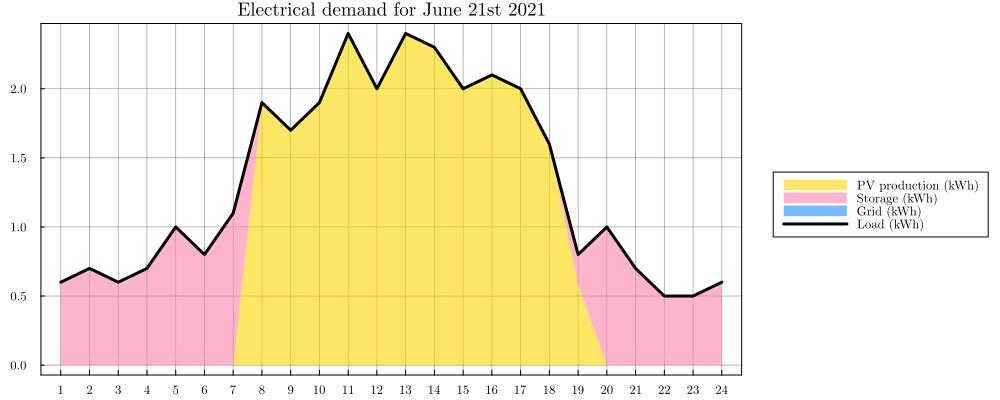

In [222]:
# Plot electrical demand for a summer day
plt = plot(linewidth=2, legend=:outerright, xticks=1:24, minorticks=false, size=(1000,400), title="Electrical demand for June 21st 2021")
line_ref = zeros(24)
plot!(plt,[1:24], line_ref, label="PV production (kWh)", fillrange=line_ref+line_PV_DE, fillalpha=0.6, linewidth=0, color=color_PV_DE)
line_ref += line_PV_DE
plot!(plt,[1:24], line_ref, label="Storage (kWh)", fillrange=line_ref+line_dis_DE, fillalpha=0.6, linewidth=0, color=color_dis_DE)
line_ref += line_dis_DE
plot!(plt,[1:24], line_ref, label="Grid (kWh)", fillrange=line_ref+line_grid_DE, fillalpha=0.6, linewidth=0, color=color_grid_DE)
plot!(plt,[1:24], line_D_elec, label="Load (kWh)", linewidth=3, color=:black)

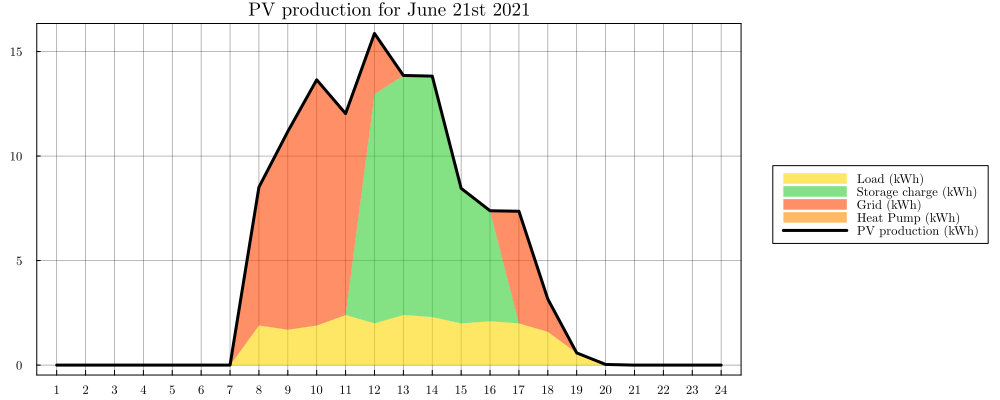

In [223]:
# Plot PV for a summer day
plt = plot(linewidth=2, xticks=1:24, minorticks=false, legend=:outerright, size=(1000,400), title="PV production for June 21st 2021")
line_ref = zeros(24)
plot!(plt,[1:24], line_ref, label="Load (kWh)", fillrange=line_ref+line_PV_DE, fillalpha=0.6, linewidth=0, color=color_PV_DE)
line_ref += line_PV_DE
plot!(plt,[1:24], line_ref, label="Storage charge (kWh)", fillrange=line_ref+line_PV_ch, fillalpha=0.6, linewidth=0, color=color_PV_ch)
line_ref += line_PV_ch
plot!(plt,[1:24], line_ref, label="Grid (kWh)", fillrange=line_ref+line_PV_grid, fillalpha=0.6, linewidth=0, color=color_PV_grid)
line_ref += line_PV_grid
plot!(plt,[1:24], line_ref, label="Heat Pump (kWh)", fillrange=line_ref+line_PV_HP, fillalpha=0.6, linewidth=0, color=color_PV_HP)
plot!(plt,[1:24], line_P_PV, label="PV production (kWh)", linewidth=3, color=:black)

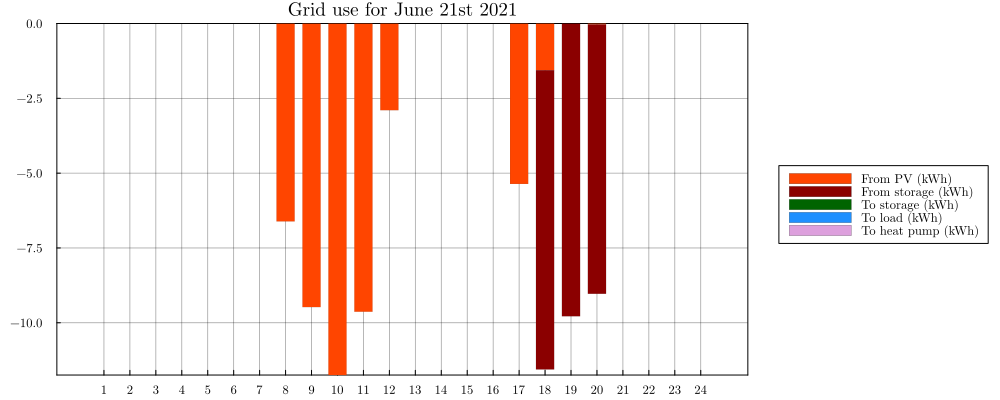

In [224]:
# Plot grid for a summer day
groupedbar([-line_PV_grid -line_dis_grid line_grid_ch line_grid_DE line_grid_HP], bar_position=:stack, bar_width=0.7, xticks=1:24, minorticks=false, 
        legend=:outerright, size=(1000,400), lw=0, title="Grid use for June 21st 2021", label=["From PV (kWh)" "From storage (kWh)" "To storage (kWh)" "To load (kWh)" "To heat pump (kWh)"],
        color = [color_PV_grid color_dis_grid color_grid_ch color_grid_DE color_grid_HP])

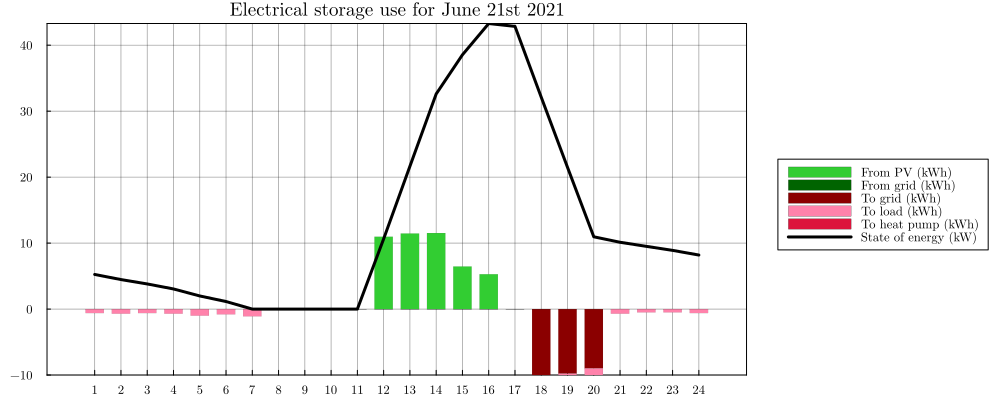

In [225]:
# Plot electrical storage for a summer day
plt = groupedbar([line_PV_ch line_grid_ch -line_dis_grid -line_dis_DE -line_dis_HP], bar_position=:stack, bar_width=0.7, xticks=1:24, minorticks=false,
        legend=:outerright, size=(1000,400), lw=0, title="Electrical storage use for June 21st 2021", label=["From PV (kWh)" "From grid (kWh)" "To grid (kWh)" "To load (kWh)" "To heat pump (kWh)"],
        color = [color_PV_ch color_grid_ch color_dis_grid color_dis_DE color_dis_HP])
#subplot = twinx()
plot!(plt,[1:24], line_soe_elec, label="State of energy (kW)", linewidth=3, color=:black)

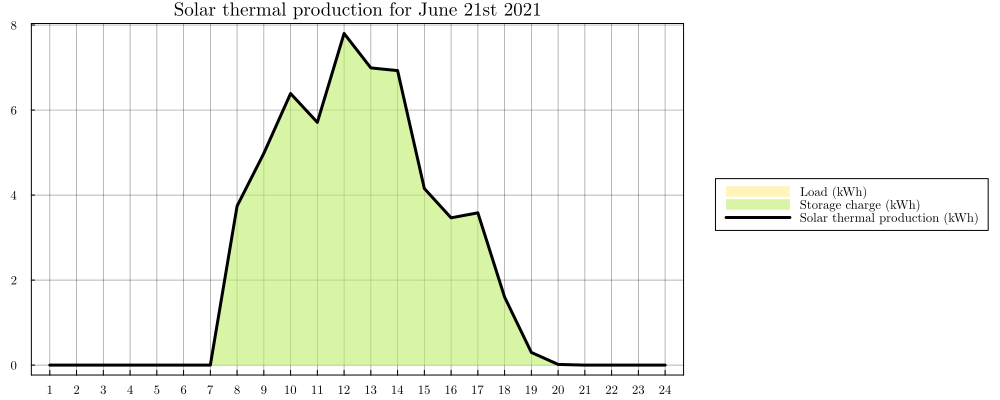

In [226]:
# Plot solar thermal for a summer day
plt = plot(linewidth=2, xticks=1:24, minorticks=false, legend=:outerright, size=(1000,400), title="Solar thermal production for June 21st 2021")
line_ref = zeros(length(D_summer))
plot!(plt,[1:24], line_ref, label="Load (kWh)", fillrange=line_ref+line_solar_DH, fillalpha=0.6, linewidth=0, color=color_solar_DH)
line_ref += line_solar_DH
plot!(plt,[1:24], line_ref, label="Storage charge (kWh)", fillrange=line_ref+line_solar_ch, fillalpha=0.6, linewidth=0, color=color_solar_ch)
plot!(plt,[1:24], line_P_solar, label="Solar thermal production (kWh)", linewidth=3, color=:black)

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\emapr\.julia\packages\PlotUtils\jEGKP\src\ticks.jl:191


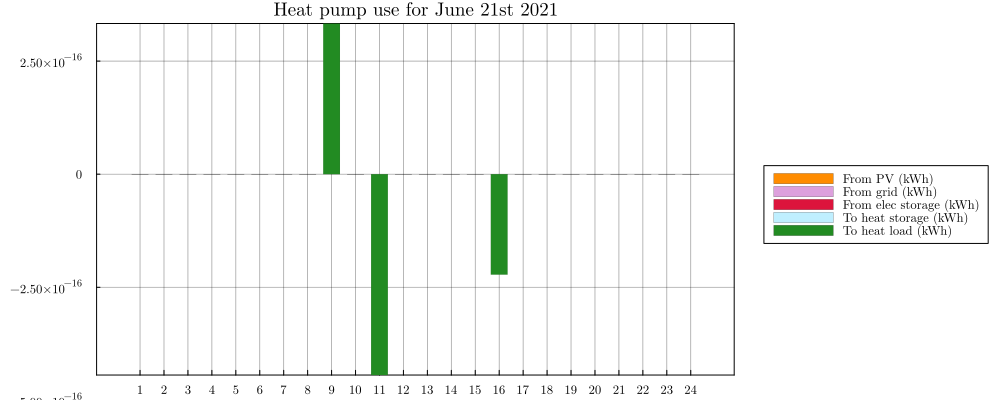

In [227]:
# Plot heat pump for a summer day
groupedbar([-line_PV_HP -line_grid_HP -line_dis_HP line_HP_DH line_HP_ch], bar_position = :stack, bar_width=0.7, xticks=1:24, minorticks=false, legend=:outerright, size=(1000,400), lw=0,
        title="Heat pump use for June 21st 2021", label=["From PV (kWh)" "From grid (kWh)" "From elec storage (kWh)" "To heat storage (kWh)" "To heat load (kWh)"],
        color = [color_PV_HP color_grid_HP color_dis_HP color_HP_DH color_HP_ch])

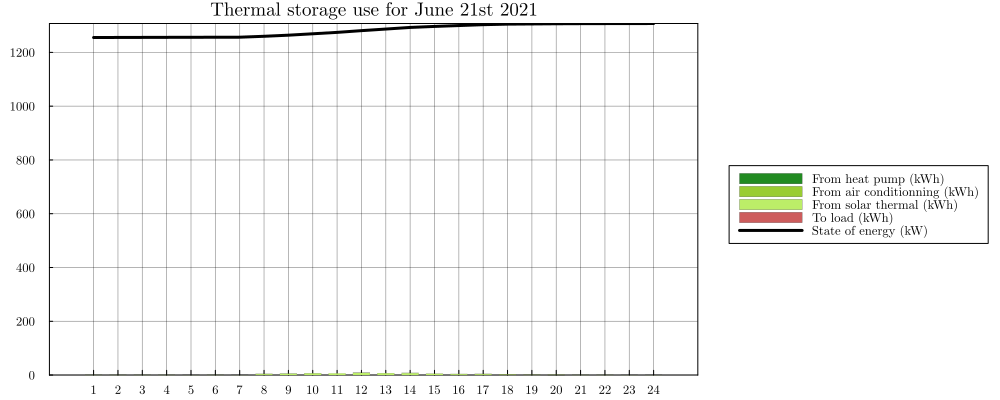

In [228]:
# Plot heat storage for a summer day
plt = groupedbar([line_HP_ch line_AC_ch line_solar_ch -line_dis_DH], bar_position = :stack, bar_width=0.7, xticks=1:24, minorticks=false, legend=:outerright,
        size=(1000,400), lw=0, title="Thermal storage use for June 21st 2021", label=["From heat pump (kWh)" "From air conditionning (kWh)" "From solar thermal (kWh)" "To load (kWh)"],
        color = [color_HP_ch color_AC_ch color_solar_ch color_dis_DH])
#subplot = twinx()
plot!(plt,[1:24],line_soe_heat, label="State of energy (kW)", linewidth=3, color=:black)

### Winter day

In [229]:
# Lines
line_PV_DE = Array(results["p_PV_DE"][D_winter,1])
line_dis_DE = Array(results["p_dis_DE"][D_winter,1])
line_grid_DE = Array(results["p_grid_DE"][D_winter,1])
line_PV_ch = Array(results["p_PV_ch"][D_winter,1])
line_PV_grid = Array(results["p_PV_grid"][D_winter,1])
line_PV_HP = Array(results["p_PV_HP"][D_winter,1])
line_dis_grid = Array(results["p_dis_grid"][D_winter,1])
line_grid_ch = Array(results["p_grid_ch"][D_winter,1])
line_grid_HP = Array(results["p_grid_HP"][D_winter,1])
line_dis_HP = Array(results["p_dis_HP"][D_winter,1])
line_soe_elec = Array(results["e_elec"][D_winter,1])
line_solar_DH = Array(results["p_solar_DH"][D_winter,1])
line_solar_ch = Array(results["p_solar_ch"][D_winter,1])
line_HP_DH = Array(results["p_HP_DH"][D_winter,1])
line_HP_ch = Array(results["p_HP_ch"][D_winter,1])
line_AC_ch = Array(results["p_AC_ch"][D_winter,1])
line_dis_DH = Array(results["p_dis_DH"][D_winter,1])
line_soe_heat = Array(results["e_heat"][D_winter,1])
line_D_elec = D_elec[D_winter,:load_1]
line_P_PV = P_PV[D_winter,:prod_1]
line_P_solar = P_solar[D_winter,:prod_1]
line_D_heat = D_heat[D_winter,:load_1]
;

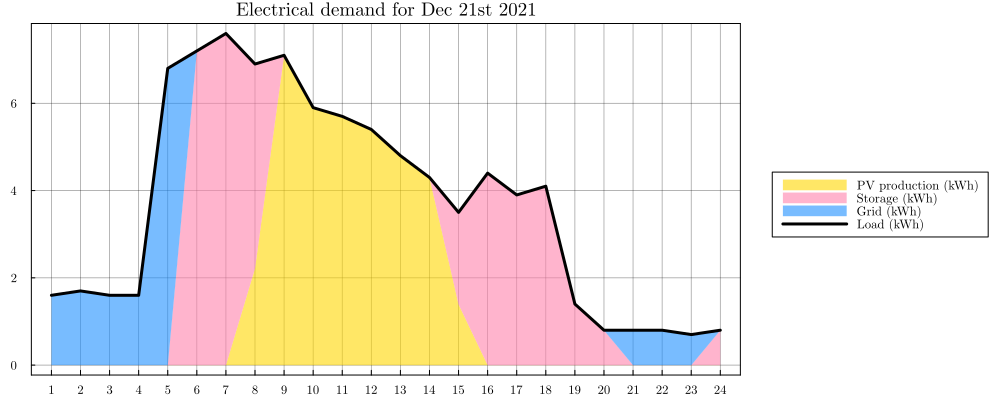

In [230]:
# Plot electrical demand for a winter day
plt = plot(linewidth=2, legend=:outerright, xticks=1:24, minorticks=false, size=(1000,400), title="Electrical demand for Dec 21st 2021")
line_ref = zeros(24)
plot!(plt,[1:24], line_ref, label="PV production (kWh)", fillrange=line_ref+line_PV_DE, fillalpha=0.6, linewidth=0, color=color_PV_DE)
line_ref += line_PV_DE
plot!(plt,[1:24], line_ref, label="Storage (kWh)", fillrange=line_ref+line_dis_DE, fillalpha=0.6, linewidth=0, color=color_dis_DE)
line_ref += line_dis_DE
plot!(plt,[1:24], line_ref, label="Grid (kWh)", fillrange=line_ref+line_grid_DE, fillalpha=0.6, linewidth=0, color=color_grid_DE)
plot!(plt,[1:24], line_D_elec, label="Load (kWh)", linewidth=3, color=:black)

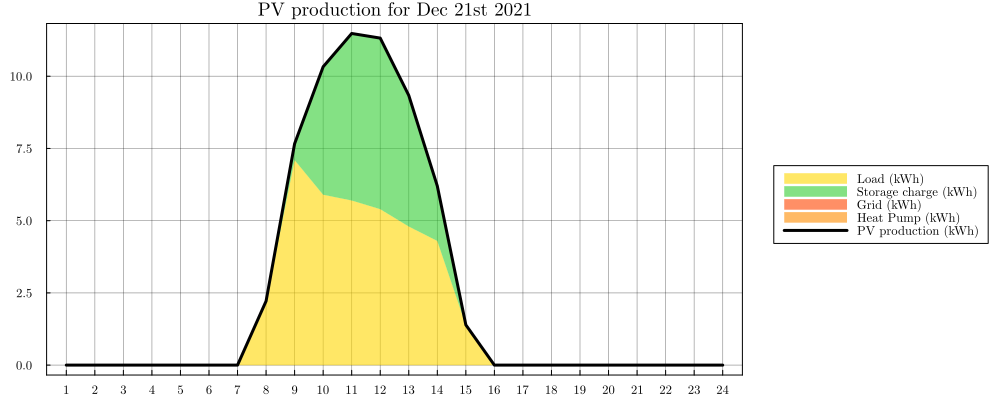

In [231]:
# Plot PV for a winter day
plt = plot(linewidth=2, xticks=1:24, minorticks=false, legend=:outerright, size=(1000,400), title="PV production for Dec 21st 2021")
line_ref = zeros(24)
plot!(plt,[1:24], line_ref, label="Load (kWh)", fillrange=line_ref+line_PV_DE, fillalpha=0.6, linewidth=0, color=color_PV_DE)
line_ref += line_PV_DE
plot!(plt,[1:24], line_ref, label="Storage charge (kWh)", fillrange=line_ref+line_PV_ch, fillalpha=0.6, linewidth=0, color=color_PV_ch)
line_ref += line_PV_ch
plot!(plt,[1:24], line_ref, label="Grid (kWh)", fillrange=line_ref+line_PV_grid, fillalpha=0.6, linewidth=0, color=color_PV_grid)
line_ref += line_PV_grid
plot!(plt,[1:24], line_ref, label="Heat Pump (kWh)", fillrange=line_ref+line_PV_HP, fillalpha=0.6, linewidth=0, color=color_PV_HP)
plot!(plt,[1:24], line_P_PV, label="PV production (kWh)", linewidth=3, color=:black)

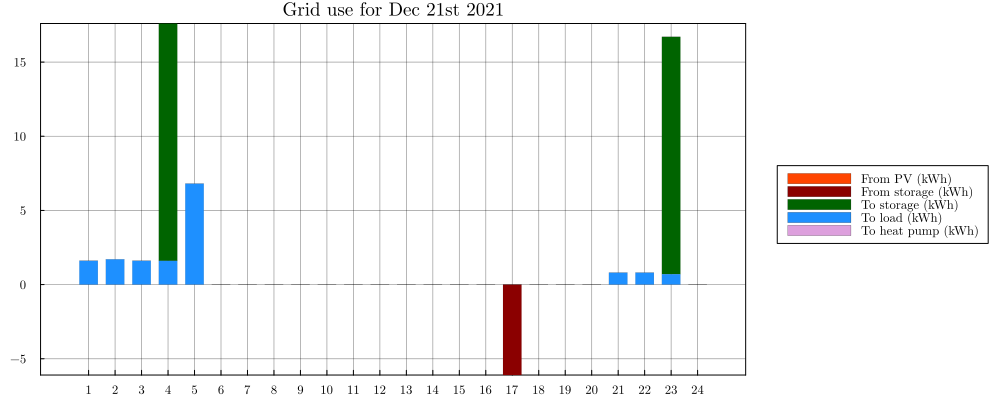

In [232]:
# Plot grid for a winter day
groupedbar([-line_PV_grid -line_dis_grid line_grid_ch line_grid_DE line_grid_HP], bar_position=:stack, bar_width=0.7, xticks=1:24, minorticks=false, 
        legend=:outerright, size=(1000,400), lw=0, title="Grid use for Dec 21st 2021", label=["From PV (kWh)" "From storage (kWh)" "To storage (kWh)" "To load (kWh)" "To heat pump (kWh)"],
        color = [color_PV_grid color_dis_grid color_grid_ch color_grid_DE color_grid_HP])

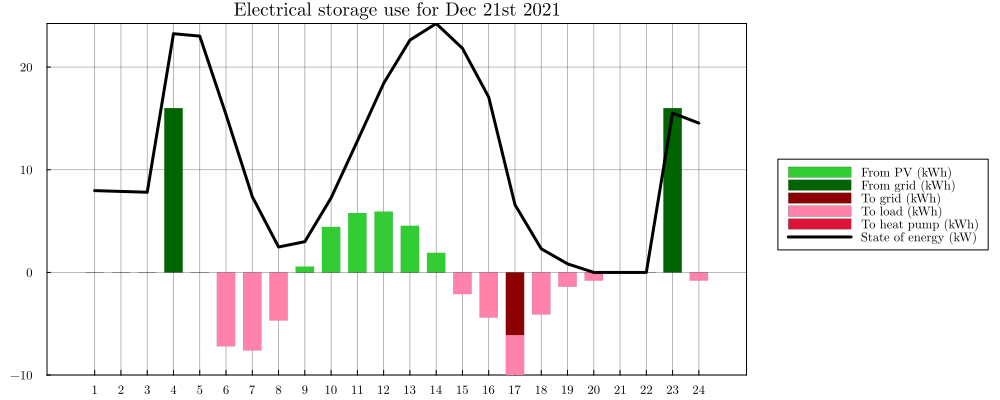

In [233]:
# Plot electrical storage for a winter day
plt = groupedbar([line_PV_ch line_grid_ch -line_dis_grid -line_dis_DE -line_dis_HP], bar_position=:stack, bar_width=0.7, xticks=1:24, minorticks=false,
        legend=:outerright, size=(1000,400), lw=0, title="Electrical storage use for Dec 21st 2021", label=["From PV (kWh)" "From grid (kWh)" "To grid (kWh)" "To load (kWh)" "To heat pump (kWh)"],
        color = [color_PV_ch color_grid_ch color_dis_grid color_dis_DE color_dis_HP])
#subplot = twinx()
plot!(plt,[1:24], line_soe_elec, label="State of energy (kW)", linewidth=3, color=:black)

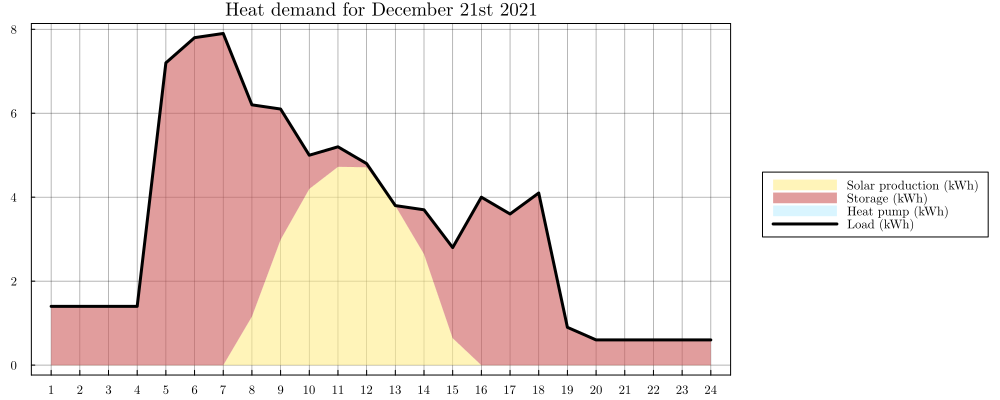

In [234]:
# Plot heat demand for a winter day
plt = plot(linewidth=2, legend=:outerright, xticks=1:24, minorticks=false, size=(1000,400), title="Heat demand for December 21st 2021")
line_ref = zeros(24)
plot!(plt,[1:24], line_ref, label="Solar production (kWh)", fillrange=line_ref+line_solar_DH, fillalpha=0.6, linewidth=0, color=color_solar_DH)
line_ref += line_solar_DH
plot!(plt,[1:24], line_ref, label="Storage (kWh)", fillrange=line_ref+line_dis_DH, fillalpha=0.6, linewidth=0, color=color_dis_DH)
line_ref += line_dis_DH
plot!(plt,[1:24], line_ref, label="Heat pump (kWh)", fillrange=line_ref+line_HP_DH, fillalpha=0.6, linewidth=0, color=color_HP_DH)
plot!(plt,[1:24], line_D_heat, label="Load (kWh)", linewidth=3, color=:black)

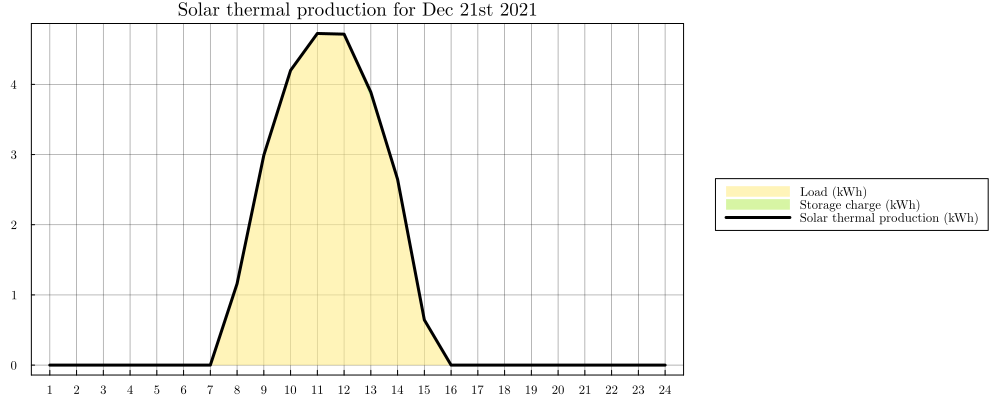

In [235]:
# Plot solar thermal for a winter day
plt = plot(linewidth=2, xticks=1:24, minorticks=false, legend=:outerright, size=(1000,400), title="Solar thermal production for Dec 21st 2021")
line_ref = zeros(length(D_summer))
plot!(plt,[1:24], line_ref, label="Load (kWh)", fillrange=line_ref+line_solar_DH, fillalpha=0.6, linewidth=0, color=color_solar_DH)
line_ref += line_solar_DH
plot!(plt,[1:24], line_ref, label="Storage charge (kWh)", fillrange=line_ref+line_solar_ch, fillalpha=0.6, linewidth=0, color=color_solar_ch)
plot!(plt,[1:24], line_P_solar, label="Solar thermal production (kWh)", linewidth=3, color=:black)

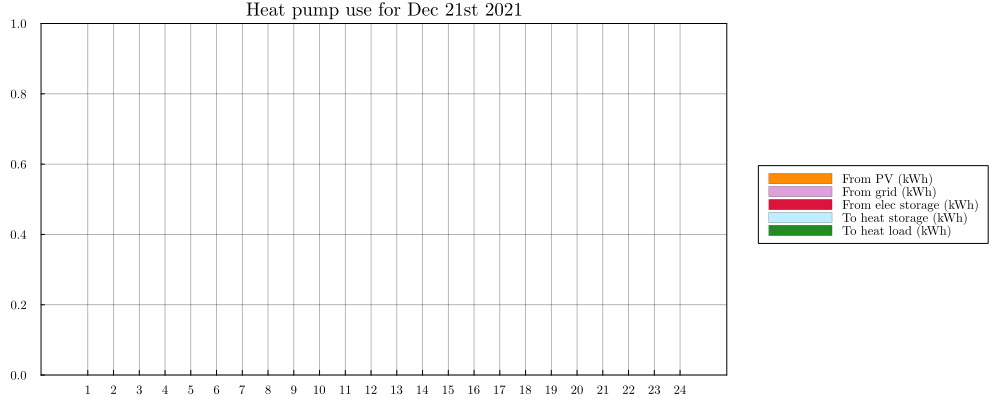

In [236]:
# Plot heat pump for a winter day
groupedbar([-line_PV_HP -line_grid_HP -line_dis_HP line_HP_DH line_HP_ch], bar_position = :stack, bar_width=0.7, xticks=1:24, minorticks=false, legend=:outerright, size=(1000,400), lw=0,
        title="Heat pump use for Dec 21st 2021", label=["From PV (kWh)" "From grid (kWh)" "From elec storage (kWh)" "To heat storage (kWh)" "To heat load (kWh)"],
        color = [color_PV_HP color_grid_HP color_dis_HP color_HP_DH color_HP_ch])

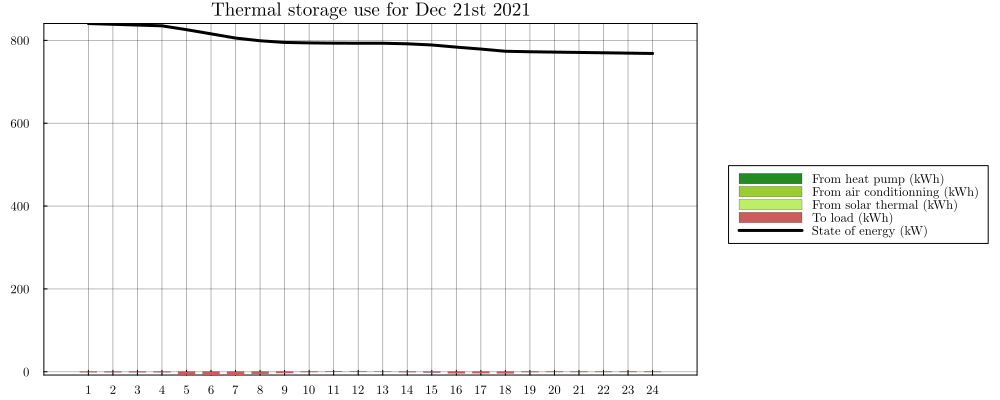

In [237]:
# Plot heat storage for a winter day
plt = groupedbar([line_HP_ch line_AC_ch line_solar_ch -line_dis_DH], bar_position = :stack, bar_width=0.7, xticks=1:24, minorticks=false, legend=:outerright,
        size=(1000,400), lw=0, title="Thermal storage use for Dec 21st 2021", label=["From heat pump (kWh)" "From air conditionning (kWh)" "From solar thermal (kWh)" "To load (kWh)"],
        color = [color_HP_ch color_AC_ch color_solar_ch color_dis_DH])
#subplot = twinx()
plot!(plt,[1:24],line_soe_heat, label="State of energy (kW)", linewidth=3, color=:black)

### Other results

In [238]:
# Plots longer horizon
n = 365
s = 1
Dn = [Int(24 * s / Δt)-23:Int(24 * n / Δt);]
line_PV_DE = Array(results["p_PV_DE"][Dn,1])
line_dis_DE = Array(results["p_dis_DE"][Dn,1])
line_grid_DE = Array(results["p_grid_DE"][Dn,1])
line_D_elec = D_elec[Dn,:load_1]
line_solar_DH = Array(results["p_solar_DH"][Dn,1])
line_dis_DH = Array(results["p_dis_DH"][Dn,1])
line_HP_DH = Array(results["p_HP_DH"][Dn,1])
line_D_heat = D_heat[Dn,:load_1]
;

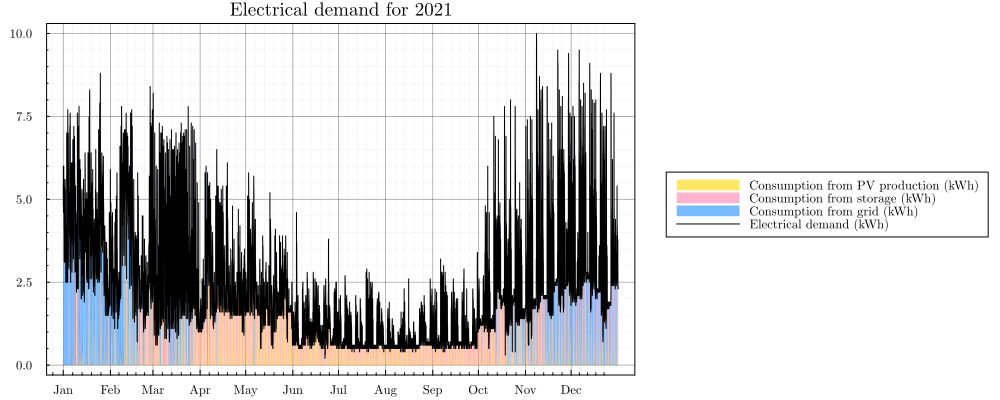

In [239]:
# Plot electrical demand - longer horizon
plt_elec = plot(linewidth=2,xticks=(dates_ticks,dates_month), legend=:outerright, size=(1000,400), title="Electrical demand for 2021")
line_ref = zeros(length(Dn))
plot!(plt_elec,dates[Dn], line_ref, label="Consumption from PV production (kWh)", fillrange=line_ref+line_PV_DE, fillalpha=0.6, linewidth=0, color=color_PV_DE)
line_ref += line_PV_DE
plot!(plt_elec,dates[Dn], line_ref, label="Consumption from storage (kWh)", fillrange=line_ref+line_dis_DE, fillalpha=0.6, linewidth=0, color=color_dis_DE)
line_ref += line_dis_DE
plot!(plt_elec,dates[Dn], line_ref, label="Consumption from grid (kWh)", fillrange=line_ref+line_grid_DE, fillalpha=0.6, linewidth=0, color=color_grid_DE)
plot!(plt_elec,dates[Dn], line_D_elec, label="Electrical demand (kWh)", linewidth=1, color=:black)

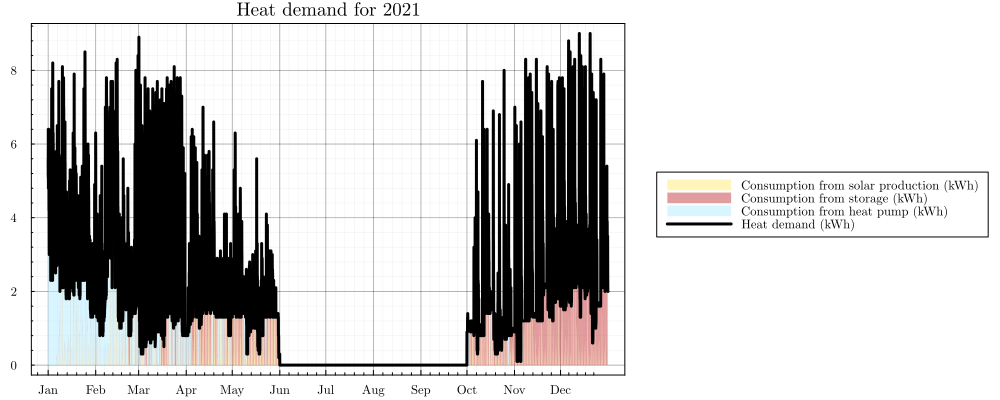

In [240]:
# Plot heat demand - longer horizon
plt_heat = plot(linewidth=2,xticks=(dates_ticks,dates_month), legend=:outerright, size=(1000,400), title="Heat demand for 2021")
line_ref = zeros(length(Dn))
plot!(plt_heat,dates[Dn], line_ref, label="Consumption from solar production (kWh)", fillrange=line_ref+line_solar_DH, fillalpha=0.6, linewidth=0, color=color_solar_DH)
line_ref += line_solar_DH
plot!(plt_heat,dates[Dn], line_ref, label="Consumption from storage (kWh)", fillrange=line_ref+line_dis_DH, fillalpha=0.6, linewidth=0, color=color_dis_DH)
line_ref += line_dis_DH
plot!(plt_heat,dates[Dn], line_ref, label="Consumption from heat pump (kWh)", fillrange=line_ref+line_HP_DH, fillalpha=0.6, linewidth=0, color=color_HP_DH)
plot!(plt_heat,dates[Dn], line_D_heat, label="Heat demand (kWh)", linewidth=3, color=:black)

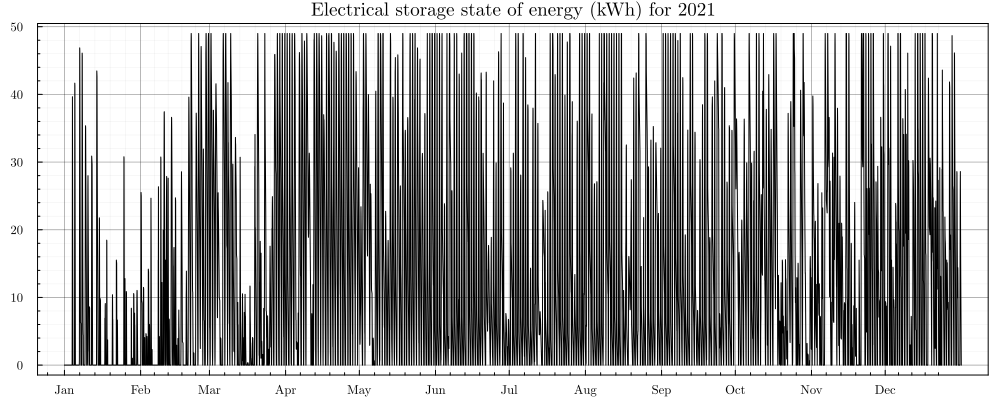

In [241]:
# Plot electrical storage soe
plt_soe = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Electrical storage state of energy (kWh) for 2021")
plot!(plt_soe,dates[Dn],Array(results["e_elec"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_soe,"e_elec.png")

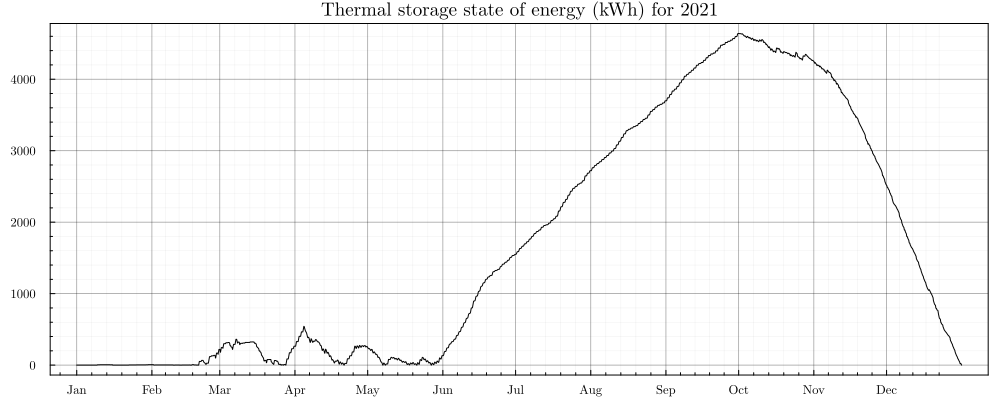

In [242]:
# Plot heat storage soe
plt_soe = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Thermal storage state of energy (kWh) for 2021")
plot!(plt_soe,dates[Dn],Array(results["e_heat"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_soe,"e_heat.png")

-1582.4894340233911


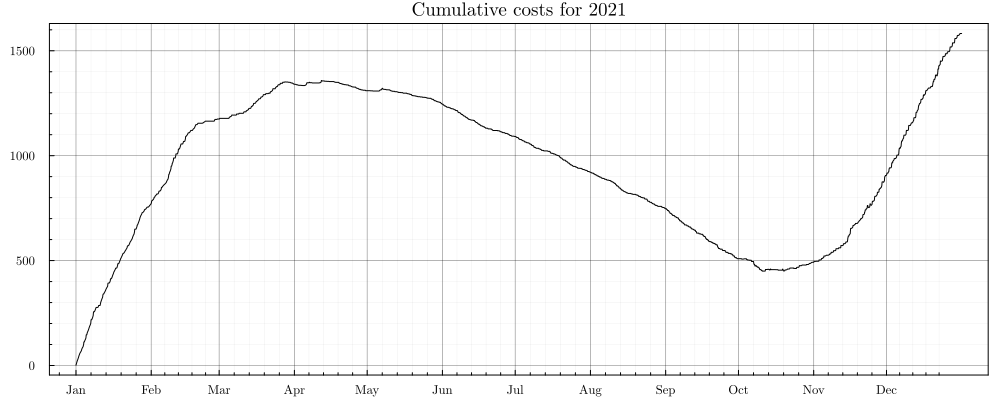

In [243]:
# Plot cumulative costs (- profit)
cum_prof = []
prof_old = 0
for t in Dn
    global cum_prof, prof_old
    prof =  Δt*(-C_buy[t]*results["p_grid_sys"][t, 1]+C_sell[t]*results["p_sys_grid"][t, 1])
    append!(cum_prof,prof_old+prof)
    prof_old += prof
end
println(prof_old)
plt_prof = plot(palette=:seaborn_muted, legend=false, linewidth=2,xticks=(dates_ticks,dates_month), size=(1000,400), title="Cumulative costs for 2021")
plot!(plt_prof,dates[Dn], -cum_prof, linewidth=1, color=:black)
#savefig(plt_prof,"cumul_costs.png")

### Plots for all the other variables

In [244]:
#=
# Plot power from stg elec to load
plt_res1 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the electrical storage to the electrical load (kW) for 2021")
plot!(plt_res1,dates[Dn],Array(results["p_dis_DE"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res1,"p_dis_DE.png")
=#

In [245]:
#=
# Plot power from stg heat to load
plt_res2 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the thermal storage to the thermal load (kW) for 2021")
plot!(plt_res2,dates[Dn],Array(results["p_dis_DH"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res2,"p_dis_DH.png")
=#

In [246]:
#=
# Plot power from stg elec to grid
plt_res3 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the electrical storage to the grid (kW) for 2021")
plot!(plt_res3,dates[Dn],Array(results["p_dis_grid"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res3,"p_dis_grid.png")
=#

In [247]:
#=
# Plot power from stg elec to HP
plt_res4 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the electrical storage to the heat pump (kW) for 2021")
plot!(plt_res4,dates[Dn],Array(results["p_dis_HP"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res4,"p_dis_HP.png")
=#

In [248]:
#=
# Plot power from grid to stg elec
plt_res5 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the grid to the electrical storage (kW) for 2021")
plot!(plt_res5,dates[Dn],Array(results["p_grid_ch"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res5,"p_grid_ch.png")
=#

In [249]:
#=
# Plot power from grid to load elec
plt_res6 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the grid to the electrical load (kW) for 2021")
plot!(plt_res6,dates[Dn],Array(results["p_grid_DE"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res6,"p_grid_DE.png")
=#

In [250]:
#=
# Plot power from grid to heat pump
plt_res7 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the grid to the heat pump (kW) for 2021")
plot!(plt_res7,dates[Dn],Array(results["p_grid_HP"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res7,"p_grid_HP.png")
=#

In [251]:
#=
# Plot power from heat pump to stg heat
plt_res8 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the heat pump to the thermal storage (kW) for 2021")
plot!(plt_res8,dates[Dn],Array(results["p_HP_ch"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res8,"p_HP_ch.png")
=#

In [252]:
#=
# Plot power from heat pump to load heat
plt_res9 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the heat pump to the thermal load (kW) for 2021")
plot!(plt_res9,dates[Dn],Array(results["p_HP_DH"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res9,"p_HP_DH.png")
=#

In [253]:
#=
# Plot power from PV to stg elec
plt_res10 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the solar PV to the electrical storage (kW) for 2021")
plot!(plt_res10,dates[Dn],Array(results["p_PV_ch"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res10,"p_PV_ch.png")
=#

In [254]:
#=
# Plot power from PV to load elec
plt_res11 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the solar PV to the electrical load (kW) for 2021")
plot!(plt_res11,dates[Dn],Array(results["p_PV_DE"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res11,"p_PV_DE.png")
=#

In [255]:
#=
# Plot power from PV to grid
plt_res12 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the solar PV to the grid (kW) for 2021")
plot!(plt_res12,dates[Dn],Array(results["p_PV_grid"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res12,"p_PV_grid.png")
=#

In [256]:
#=
# Plot power from PV to HP
plt_res13 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the solar PV to the heat pump (kW) for 2021")
plot!(plt_res13,dates[Dn],Array(results["p_PV_HP"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res13,"p_PV_HP.png")
=#

In [257]:
#=
# Plot power from solar to stg heat
plt_res14 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the solar thermal to the thermal storage (kW) for 2021")
plot!(plt_res14, dates[Dn],Array(results["p_solar_ch"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res14,"p_solar_ch.png")
=#

In [258]:
#=
# Plot power from solar to load heat
plt_res15 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from the solar thermal to the thermal load (kW) for 2021")
plot!(plt_res15, dates[Dn],Array(results["p_solar_DH"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res15,"p_solar_DH.png")
=#

In [259]:
#=
# Plot power from solar to stg heat
plt_res16 = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Power from AC to the thermal storage (kW) for 2021")
plot!(plt_res16, dates[Dn],Array(results["p_AC_ch"][Dn,1]), linewidth=1, color=:black)
#savefig(plt_res16,"p_AC_ch.png")
=#

## Length of the horizon

### Determine Optimal Horizon

In [260]:
nb_d_test_h = 365

365

In [261]:
#=
# Determine min horizon
E_heat_init_loc = E_heat_init 
E_elec_init_loc = E_elec_init 
nb_d_min = []
cumul_cost_vec = []
soe_elec_vec = []
soe_heat_vec = []
cumul_cost = 0
max_length = 150
data_avail = length(D_heat[:,"load_1"])
nb_d_h_min = 25

for d in 1:nb_d_test_h
    diff_level = 100
    start_d = 1+24*(d-1)
    end_d = start_d + 23
    E_heat_min = E_heat_init_loc
    for t in start_d:24*(d+nb_d_h_min-1)
        E_heat_min = ceil(max(0, ρ_heat * E_heat_min - Δt * (1/η_elec_dis) * min(D_heat[t,"load_1"],P_heat_dis)),digits=3)
    end
    E_heat_max = E_heat_init_loc
    for t in start_d:24*(d+nb_d_h_min-1) # Start from previous level
        if D_heat[t,"load_1"] - P_solar[t,"prod_1"] <= P_HP
            charge_max = min(P_heat_ch, P_HP + P_solar[t,"prod_1"] + P_AC[t,"prod_1"] - D_heat[t,"load_1"])
            E_heat_max = min(E_heat, ρ_heat * E_heat_max + Δt * η_heat_ch * charge_max)
        else
            discharge_min = min(P_heat_dis, D_heat[t,"load_1"] - P_solar[t,"prod_1"] - P_HP)
            E_heat_max = floor(max(0, ρ_heat * E_heat_max - Δt * (1/η_elec_dis) * discharge_min),digits=3)
        end
    end
    nb_d_h = nb_d_h_min

    while diff_level > 1e-6 && nb_d_h < 150 && 24*(d+nb_d_h)<=data_avail
        #if nb_d_h > 95
        #    println(diff_level)
        #end
        global results_high, T_run
        end_run = 24*(d+nb_d_h)
        T_run = [start_d:end_run;]
        H = length(T_run)
        # Calculate lowest reachable level
        E_elec_min = ceil(max(0, (ρ_elec ^ H) * E_elec_init_loc - sum(ρ_elec ^ (t-1) for t = 1:H) * Δt * (1/η_elec_dis) * P_elec_dis),digits=3)
        for t in end_run-23:end_run # Start from previous level
            E_heat_min = ceil(max(0, ρ_heat * E_heat_min - Δt * (1/η_elec_dis) * min(D_heat[t,"load_1"],P_heat_dis)),digits=3)
        end
        # Optimization for lowest reachable level
        results_low = syst_schedule([1:end_run-start_d+1;], E_elec_min, E_heat_min, C_buy[T_run], C_sell[T_run], E_elec_init_loc, E_heat_init_loc, start_d, choice_objective)
        E_final_elec_min = results_low["e_elec"][24,1]
        E_final_heat_min = results_low["e_heat"][24,1]

        # Calculate highest reachable level
        E_elec_max = floor(min(E_elec, (ρ_elec ^ H) * E_elec_init_loc + sum(ρ_elec ^ (t-1) for t = 1:H) * Δt * η_elec_ch * P_elec_ch),digits=3)
        for t in end_run-23:end_run # Start from previous level
            if D_heat[t,"load_1"] - P_solar[t,"prod_1"] <= P_HP
                charge_max = min(P_heat_ch, P_HP + P_solar[t,"prod_1"] + P_AC[t,"prod_1"] - D_heat[t,"load_1"])
                E_heat_max = min(E_heat, ρ_heat * E_heat_max + Δt * η_heat_ch * charge_max)
            else
                discharge_min = min(P_heat_dis, D_heat[t,"load_1"] - P_solar[t,"prod_1"] - P_HP)
                E_heat_max = floor(max(0, ρ_heat * E_heat_max - Δt * (1/η_elec_dis) * discharge_min),digits=3)
            end
        end
        # Optimization for highest reachable level
        results_high = syst_schedule([1:end_run-start_d+1;], E_elec_max, E_heat_max, C_buy[T_run], C_sell[T_run], E_elec_init_loc, E_heat_init_loc, start_d, choice_objective)
        E_final_elec_max = results_high["e_elec"][24,1]
        E_final_heat_max = results_high["e_heat"][24,1]

        diff_level = max(E_final_elec_max-E_final_elec_min,E_final_heat_max-E_final_heat_min)
        nb_d_h += 1
    end
    nb_d_h -= 1
    println("Day ",d,": ",nb_d_h)
    append!(nb_d_min, nb_d_h)
    E_heat_init_loc = results_high["e_heat"][24,1]
    E_elec_init_loc = results_high["e_elec"][24,1]
    for t in 1:24
        cumul_cost += π[1]*Δt*(C_buy[T_run][t]*results_high["p_grid_sys"][t, 1]-C_sell[T_run][t]*results_high["p_sys_grid"][t, 1])
        append!(cumul_cost_vec, cumul_cost)
        append!(soe_elec_vec, results_high["e_elec"][t, 1])
        append!(soe_heat_vec, results_high["e_heat"][t, 1])
    end
end
writedlm("nb_d_min.csv", nb_d_min, ", ")

println("Costs for an optimized rolling-horizon window: ",round(cumul_cost, digits=2))
;
=#

### Results for optimal horizon

In [262]:
#=
# Costs for an optimal window
nb_d_df = CSV.read("nb_d_min_huge.csv", DataFrame)
nb_d_min = (nb_d_df.Horizon)
E_heat_init_loc_nd = E_heat_init 
E_elec_init_loc_nd = E_elec_init 
cumul_cost_vec = []
soe_elec_vec = []
soe_heat_vec = []
cumul_cost_nd = 0

for d in 1:nb_d_test_h
    #println(d)
    start_d = 1+24*(d-1)
    end_d = start_d + 23
    end_run = 24*(d+nb_d_min[d])
    T_run = [start_d:end_run;]
    H = length(T_run)
 
    # Optimization for lowest reachable level
    results_nd = syst_schedule([1:end_run-start_d+1;], "free", "free", C_buy[T_run], C_sell[T_run], E_elec_init_loc_nd, E_heat_init_loc_nd, start_d, choice_objective)

    E_heat_init_loc_nd = results_nd["e_heat"][24,1]
    E_elec_init_loc_nd = results_nd["e_elec"][24,1]
    for t in 1:24
        cumul_cost_nd += π[1]*Δt*(C_buy[T_run][t]*results_nd["p_grid_sys"][t, 1]-C_sell[T_run][t]*results_nd["p_sys_grid"][t, 1])
        append!(cumul_cost_vec, cumul_cost_nd)
        append!(soe_elec_vec, results_nd["e_elec"][t, 1])
        append!(soe_heat_vec, results_nd["e_heat"][t, 1])
    end
end
println("Costs for a rolling-horizon with optimal window : ",round(cumul_cost_nd, digits=2))
;
=#

In [263]:

# Plot minimum horizon
plt_h = plot(xticks=(dates_ticks,dates_month), legend=false, size=(1000,400), title="Minimum length of the horizon for 2021")
plot!(plt_h, dates[1:nb_d_test_h], nb_d_min, linewidth=2, color=:red)


UndefVarError: UndefVarError: nb_d_min not defined

In [264]:

# Plot state of energy - Elec
plt_soe_elec_2 = plot(xticks=(dates_ticks,dates_month), legend=:outerright, size=(1000,400), title="State of energy- Electricty storage - 2021")
plot!(plt_soe_elec_2,dates[1:nb_d_test_h*24],soe_elec_vec, label="Optimal horizon", linewidth=1, color=:black)


UndefVarError: UndefVarError: soe_elec_vec not defined

In [265]:

# Plot state of energy - Heat
plt_soe_heat_2 = plot(xticks=(dates_ticks,dates_month), legend=:outerright, size=(1000,400), title="State of energy- Heat storage - 2021")
plot!(plt_soe_heat_2,dates[1:nb_d_test_h*24],soe_heat_vec, label="Optimal horizon", linewidth=1, color=:black)


UndefVarError: UndefVarError: soe_heat_vec not defined

In [266]:

# Plot cumulative costs
plt_cost_2 = plot(xticks=(dates_ticks,dates_month), legend=:outerright, size=(1000,400), title="Cumulative costs for 2021")
plot!(plt_cost_2,dates[1:nb_d_test_h*24],cumul_cost_vec, label="Optimal horizon", linewidth=1, color=:black)


UndefVarError: UndefVarError: cumul_cost_vec not defined

### Horizon of 2 days

In [267]:

# Costs for a 2 days window
nb_d_h = 2
E_heat_init_loc_2d = E_heat_init 
E_elec_init_loc_2d = E_elec_init 
cumul_cost_vec_2d = []
soe_elec_vec_2d = []
soe_heat_vec_2d = []
cumul_cost_2d = 0

for d in 1:nb_d_test_h
    #println(d)
    start_d = 1+24*(d-1)
    end_d = start_d + 23
    end_run = 24*(d+nb_d_h)
    T_run = [start_d:end_run;]
    H = length(T_run)
 
    # Optimization for lowest reachable level
    results_2d = syst_schedule([1:end_run-start_d+1;], "free", "free", C_buy[T_run], C_sell[T_run], E_elec_init_loc_2d, E_heat_init_loc_2d, start_d, choice_objective)

    E_heat_init_loc_2d = results_2d["e_heat"][24,1]
    E_elec_init_loc_2d = results_2d["e_elec"][24,1]
    for t in 1:24
        cumul_cost_2d += π[1]*Δt*(C_buy[T_run][t]*results_2d["p_grid_sys"][t, 1]-C_sell[T_run][t]*results_2d["p_sys_grid"][t, 1])
        append!(cumul_cost_vec_2d, cumul_cost_2d)
        append!(soe_elec_vec_2d, results_2d["e_elec"][t, 1])
        append!(soe_heat_vec_2d, results_2d["e_heat"][t, 1])
    end
end
println("Costs for a rolling-horizon window of two days: ",round(cumul_cost_2d, digits=2))
;


Costs for a rolling-horizon window of two days: 1879.06


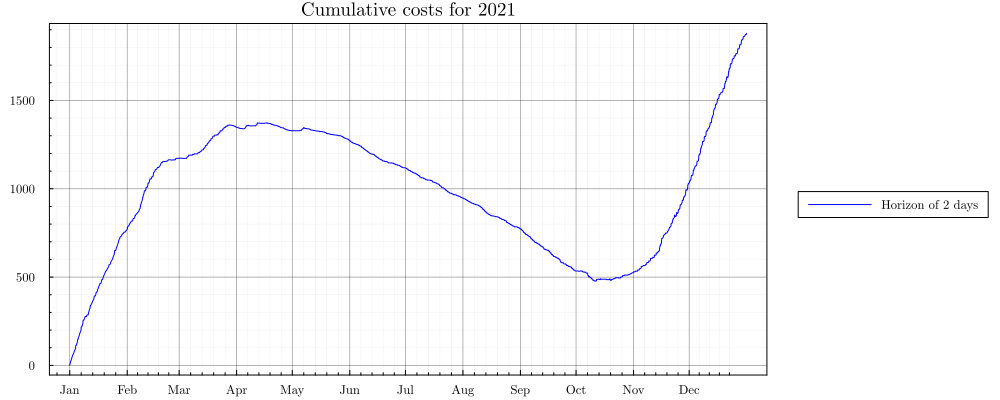

In [268]:

# Plot cumulative costs
plot!(plt_cost_2,dates[1:nb_d_test_h*24],cumul_cost_vec_2d, label="Horizon of 2 days", linewidth=1, color=:blue)


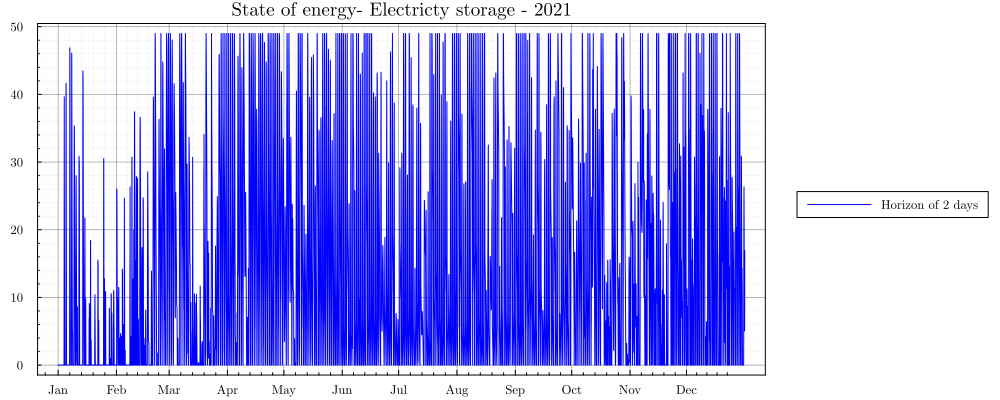

In [269]:

# Plot state of energy - Elec
plot!(plt_soe_elec_2,dates[1:nb_d_test_h*24],soe_elec_vec_2d, label="Horizon of 2 days", linewidth=1, color=:blue)


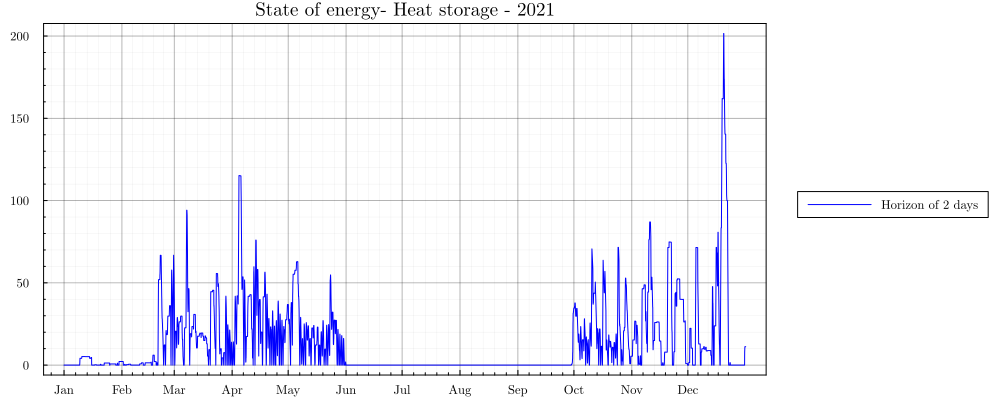

In [270]:

# Plot state of energy - Heat
plot!(plt_soe_heat_2,dates[1:nb_d_test_h*24],soe_heat_vec_2d, label="Horizon of 2 days", linewidth=1, color=:blue)
